In [1]:
from keras.models import load_model
from keras.preprocessing.image import load_img, img_to_array
import numpy as np
import cv2
import dlib
import os
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
import psutil

In [43]:
print("Memory Usage Before:", psutil.virtual_memory())

Memory Usage Before: svmem(total=14877257728, available=4923785216, percent=66.9, used=9953472512, free=4923785216)


In [2]:
loaded_model = load_model('gender.h5')

In [3]:
from keras.preprocessing.image import load_img, img_to_array
import numpy as np
import cv2
import dlib
import os

def preprocess_image(input_image, target_size=(128, 128), expansion_factor=0.2):
    # Initialize the face detector and landmark predictor
    detector = dlib.get_frontal_face_detector()
    predictor = dlib.shape_predictor("./Utilities/shape_predictor_68_face_landmarks.dat")  # Provide the correct path

    # Read the image
    img = cv2.imread(input_image)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Detect faces in the image
    faces = detector(gray)

    # Process the first detected face
    if faces:
        face = faces[0]
        landmarks = predictor(gray, face)

        # Expand the bounding box around the face
        x, y, w, h = cv2.boundingRect(np.array([(landmark.x, landmark.y) for landmark in landmarks.parts()]))
        expansion_width = int(expansion_factor * w)
        expansion_height = int(expansion_factor * h)
        x_expanded = max(0, x - expansion_width)
        y_expanded = max(0, y - expansion_height)
        w_expanded = min(img.shape[1] - x_expanded, w + 2 * expansion_width)
        h_expanded = min(img.shape[0] - y_expanded, h + 2 * expansion_height)

        # Extract the expanded face region
        extracted_face = gray[y_expanded:y_expanded + h_expanded, x_expanded:x_expanded + w_expanded]

        # Resize the face to the target size
        resized_face = cv2.resize(extracted_face, target_size)
        cv2.imwrite('test.jpg', resized_face)

        # Normalize the pixel values to the range [0, 1]
        normalized_face = resized_face / 255.0

        # Expand the dimensions to match the input shape expected by the model
        normalized_face = np.expand_dims(normalized_face, axis=0)

        return normalized_face

    # If no faces are found, return None
    return None



In [4]:
import matplotlib.pyplot as plt
import cv2
def predict_and_plot_original(model, image_path, threshold=0.5):
    # Read the original image
    original_image = cv2.imread(image_path)

    # Preprocess the image
    preprocessed_image = preprocess_image(image_path)

    # Make predictions using the loaded model
    predictions = model.predict(preprocessed_image)

    # Determine the predicted class based on the threshold
    predicted_class = 'Male' if predictions[0][0] >= threshold else 'Female'

    # Plot the original image with the predicted class as the title
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title(f"Predicted Class: {predicted_class}")
    plt.axis('off')
    plt.show()

    # Return the predictions
    return {'class': predicted_class, 'probabilities': predictions}

In [189]:
def predict_folder_original(model, folder_path, threshold=0.5):
    # Initialize a dictionary to store the frequencies of each predicted class
    class_frequency = {'Male': 0, 'Female': 0}

    # Iterate through all files in the folder
    for filename in os.listdir(folder_path):
        if filename.endswith(('.jpg', '.jpeg', '.png', '.JPG')):  # Check if the file is an image
            # Construct the full path to the image
            image_path = os.path.join(folder_path, filename)

            # Make predictions using the provided model and threshold
            predictions_info = predict_and_plot_original(model, image_path, threshold)

            # Increment the frequency count for the predicted class
            predicted_class = predictions_info['class']
            class_frequency[predicted_class] += 1

    return class_frequency

1/1 [==============================] - 0s 124ms/step


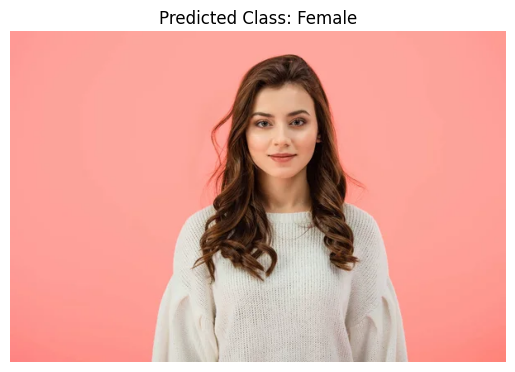

1/1 [==============================] - 0s 103ms/step


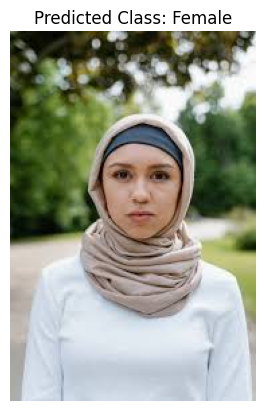

1/1 [==============================] - 0s 109ms/step


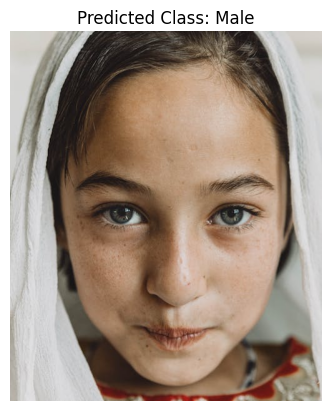

1/1 [==============================] - 0s 86ms/step


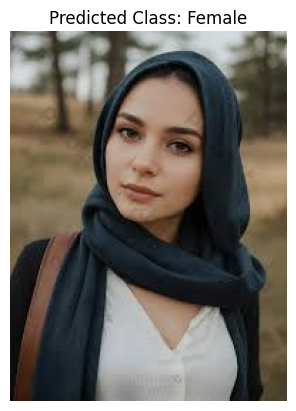

1/1 [==============================] - 0s 108ms/step


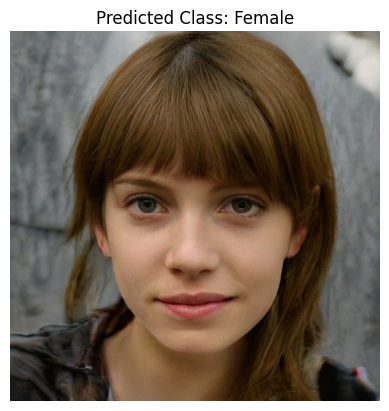

1/1 [==============================] - 0s 98ms/step


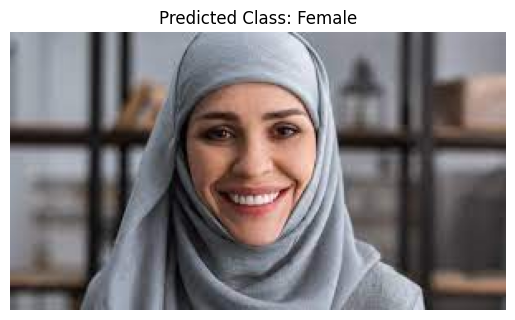

1/1 [==============================] - 0s 90ms/step


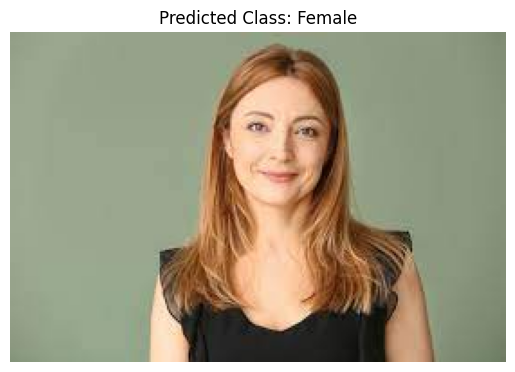

1/1 [==============================] - 0s 94ms/step


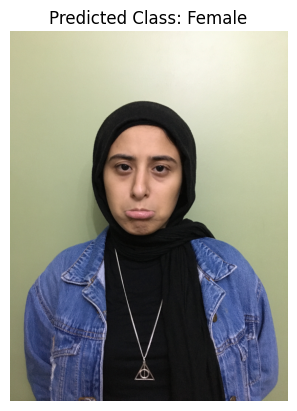

1/1 [==============================] - 0s 97ms/step


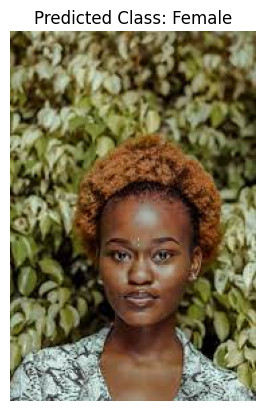

1/1 [==============================] - 0s 87ms/step


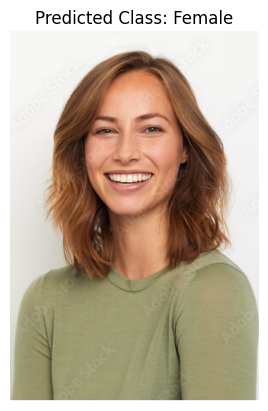

1/1 [==============================] - 0s 99ms/step


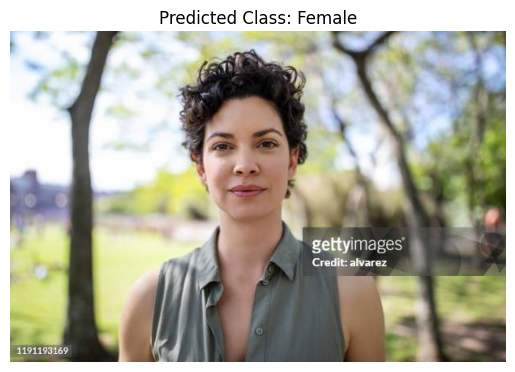

1/1 [==============================] - 0s 86ms/step


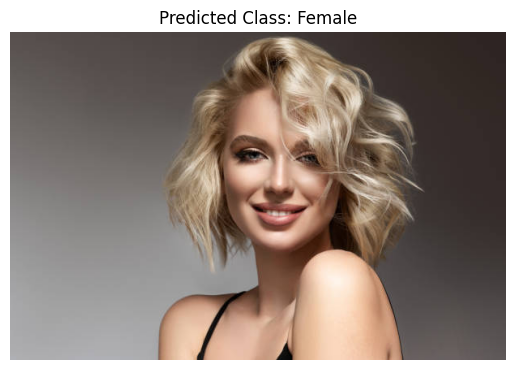

1/1 [==============================] - 0s 96ms/step


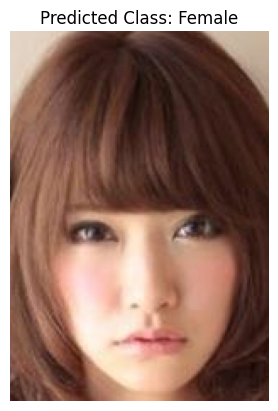

1/1 [==============================] - 0s 93ms/step


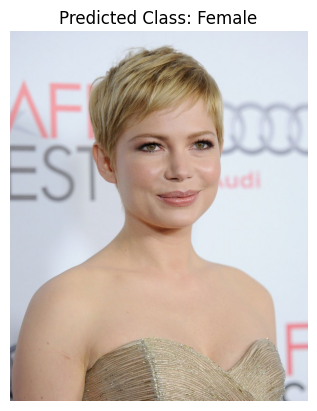

1/1 [==============================] - 0s 94ms/step


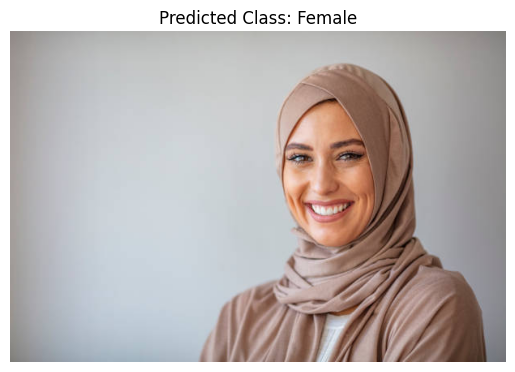

1/1 [==============================] - 0s 92ms/step


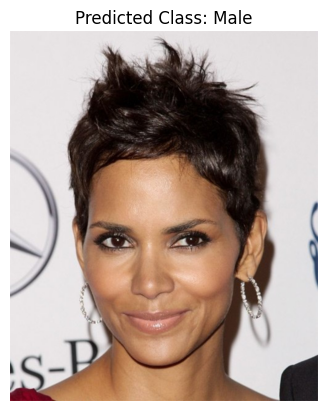

1/1 [==============================] - 0s 95ms/step


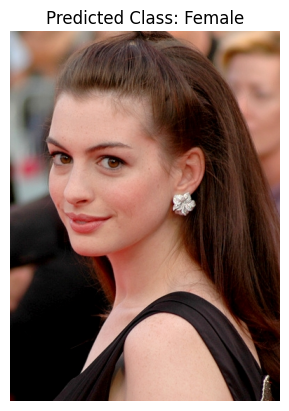

1/1 [==============================] - 0s 94ms/step


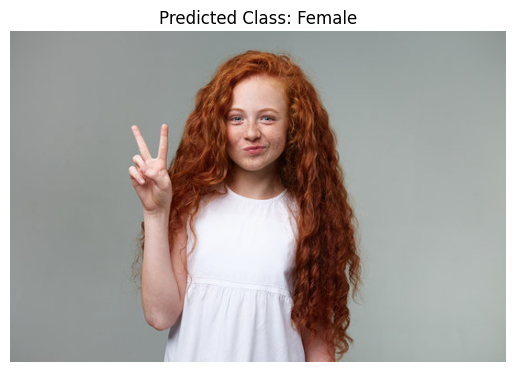

1/1 [==============================] - 0s 92ms/step


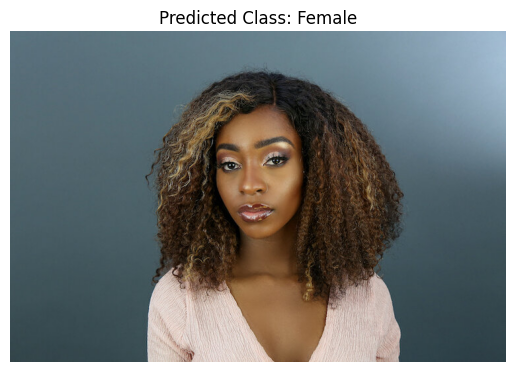

1/1 [==============================] - 0s 97ms/step


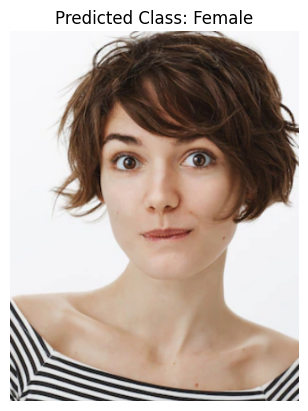

1/1 [==============================] - 0s 88ms/step


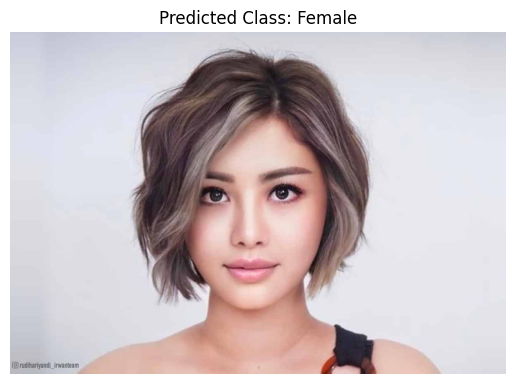

{'Male': 2, 'Female': 19}


In [192]:
folder_path = './test_examples/females'
class_frequency = predict_folder_original(loaded_model2, folder_path)
print(class_frequency)

1/1 [==============================] - 0s 93ms/step


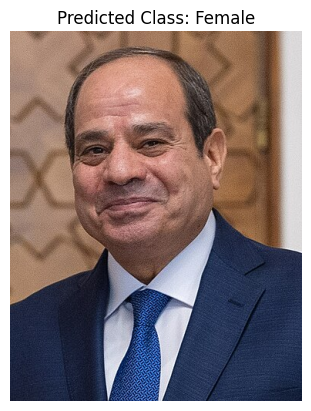

1/1 [==============================] - 0s 88ms/step


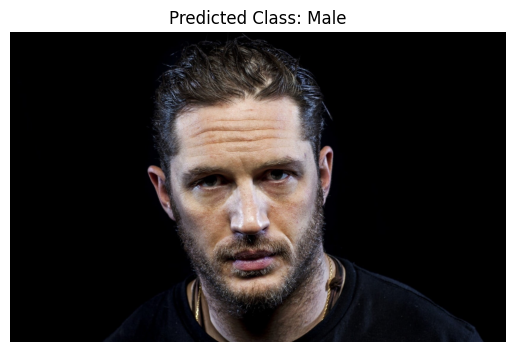

1/1 [==============================] - 0s 94ms/step


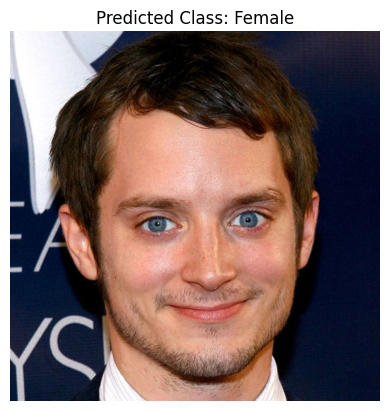

1/1 [==============================] - 0s 84ms/step


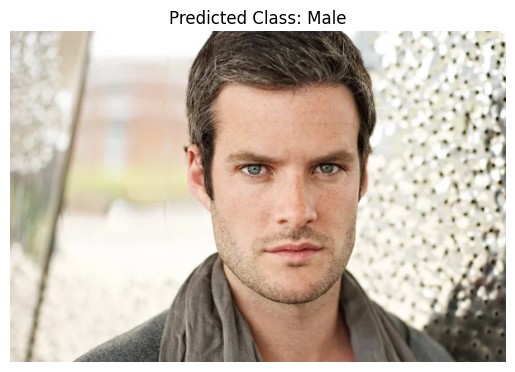

1/1 [==============================] - 0s 94ms/step


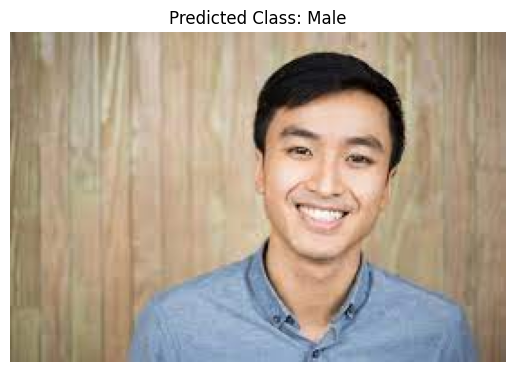

1/1 [==============================] - 0s 91ms/step


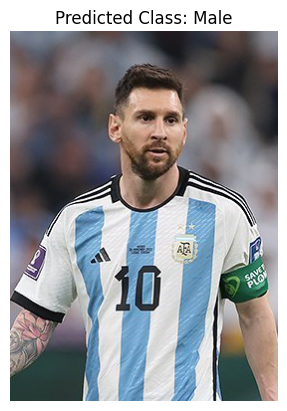

1/1 [==============================] - 0s 91ms/step


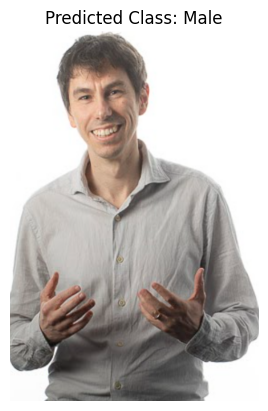

1/1 [==============================] - 0s 97ms/step


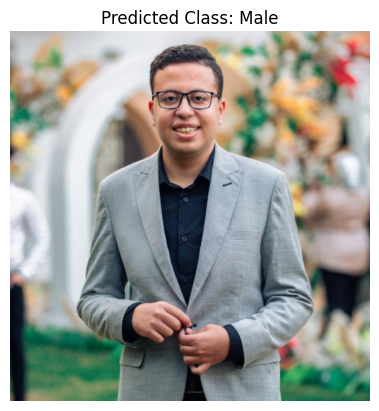

1/1 [==============================] - 0s 97ms/step


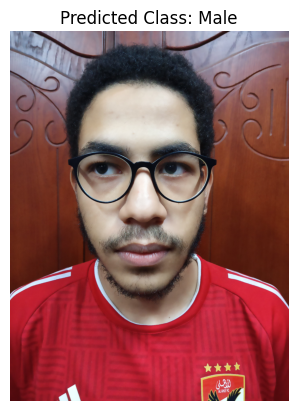

1/1 [==============================] - 0s 86ms/step


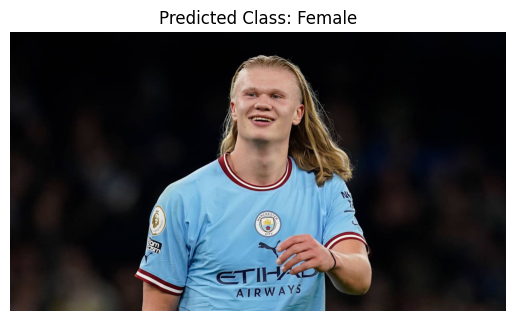

1/1 [==============================] - 0s 91ms/step


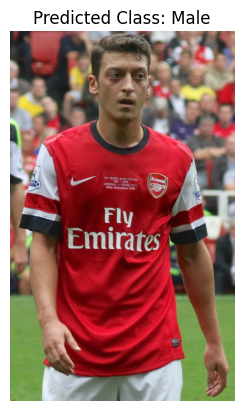

1/1 [==============================] - 0s 85ms/step


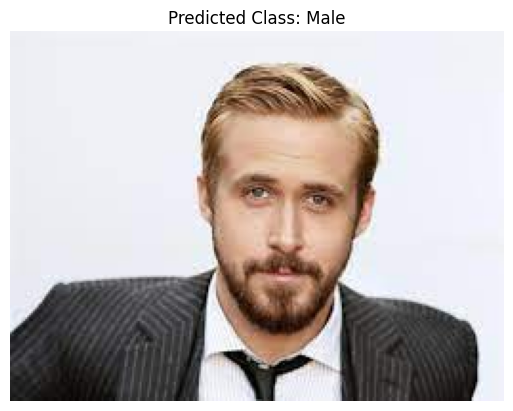

1/1 [==============================] - 0s 98ms/step


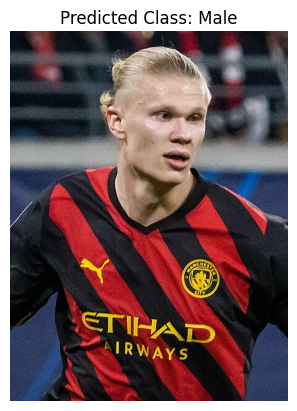

1/1 [==============================] - 0s 85ms/step


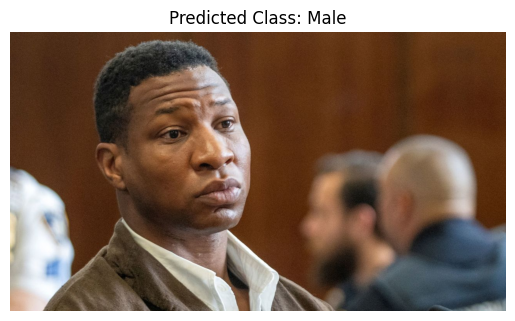

1/1 [==============================] - 0s 106ms/step


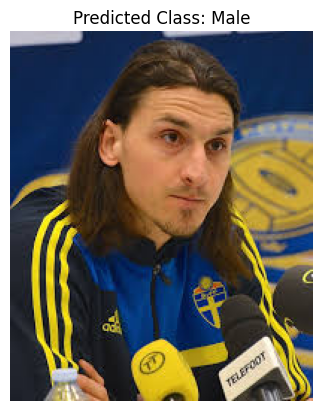

1/1 [==============================] - 0s 96ms/step


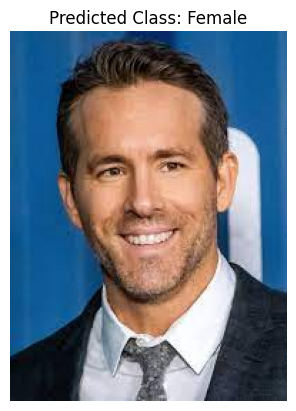

1/1 [==============================] - 0s 85ms/step


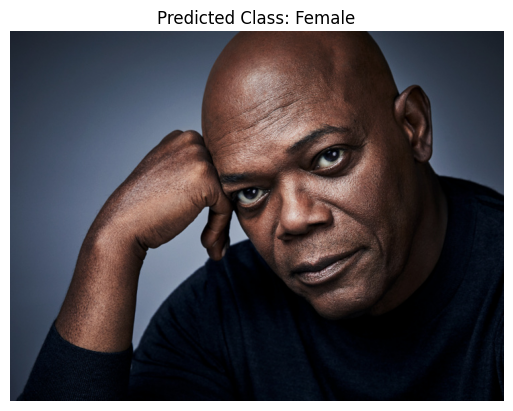

1/1 [==============================] - 0s 109ms/step


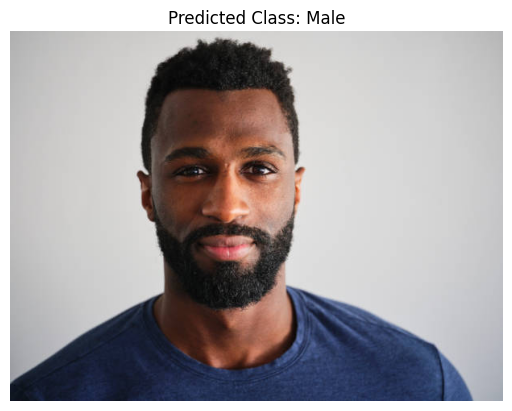

1/1 [==============================] - 0s 94ms/step


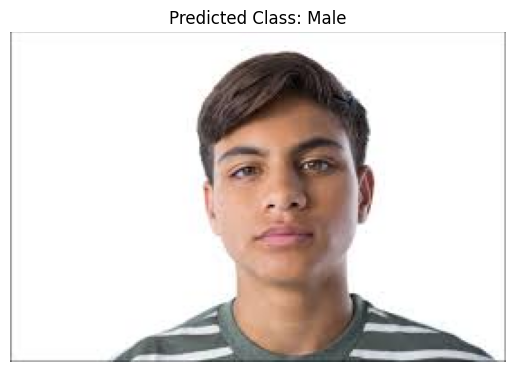

1/1 [==============================] - 0s 91ms/step


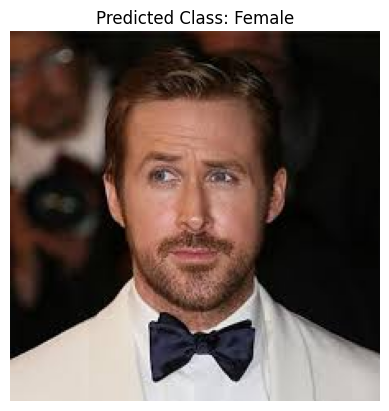

1/1 [==============================] - 0s 91ms/step


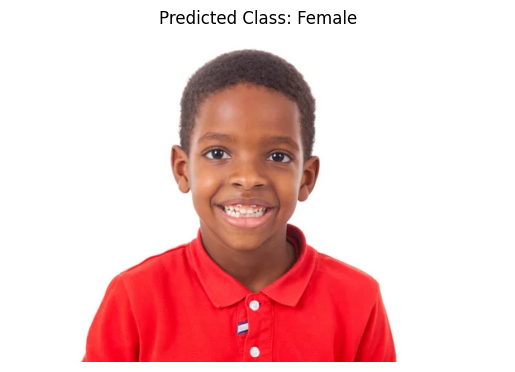

{'Male': 14, 'Female': 7}


In [193]:
folder_path = './test_examples/males'
class_frequency = predict_folder_original(loaded_model2, folder_path)
print(class_frequency)

In [5]:
def predicts(model, image_path):
    # Read the original image
    original_image = cv2.imread(image_path)

    # Preprocess the image
    preprocessed_image = preprocess_image(image_path)

    # Make predictions using the loaded model
    predictions = model.predict(preprocessed_image)

    # Get the index of the highest element in the predictions array
    predicted_index = np.argmax(predictions)

    # Determine the predicted class based on the index
    predicted_class = 'Male' if predicted_index == 1 else 'Female'

    # Plot the original image with the predicted class as the title
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title(f"Predicted Class: {predicted_class}")
    plt.axis('off')
    plt.show()

    # Return the predictions
    return predictions

In [6]:
def predict_folder(model, folder_path):
    # Initialize dictionaries to store the frequency of each predicted class
    class_frequency = {'Male': 0, 'Female': 0}

    # Initialize counters for different thresholds
    count_below_07 = 0
    count_below_05 = 0
    count_below_04 = 0

    # Iterate through all files in the folder
    for filename in os.listdir(folder_path):
        if filename.endswith(('.jpg', '.jpeg', '.png', '.JPG')):  # Check if the file is an image
            # Construct the full path to the image
            image_path = os.path.join(folder_path, filename)

            # Make predictions using the provided model and threshold
            predictions = predicts(model, image_path)

            # Get the second index value in the predictions array
            second_index_value = predictions[0][0]

            # Print statements to track the counts based on different thresholds
            if second_index_value < 0.7:
                count_below_07 += 1
            if second_index_value < 0.5:
                count_below_05 += 1
            if second_index_value < 0.4:
                count_below_04 += 1

            # Get the index of the highest element in the predictions array
            predicted_index = np.argmax(predictions)

            # Determine the predicted class based on the index
            predicted_class = 'Male' if predicted_index == 1 else 'Female'

            # Increment the frequency count for the predicted class
            class_frequency[predicted_class] += 1

    # Print counts below different thresholds
    print(f"Number of times second index was less than 0.7: {count_below_07}")
    print(f"Number of times second index was less than 0.5: {count_below_05}")
    print(f"Number of times second index was less than 0.4: {count_below_04}")

    return class_frequency

1/1 [==============================] - 0s 59ms/step


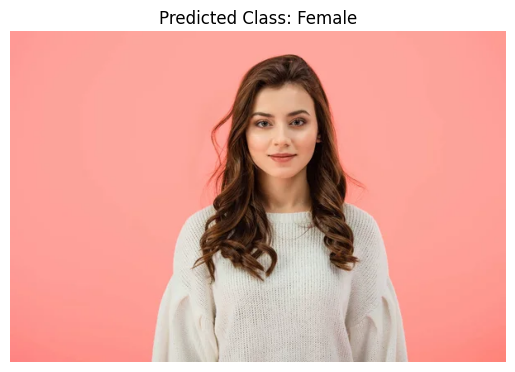

1/1 [==============================] - 0s 51ms/step


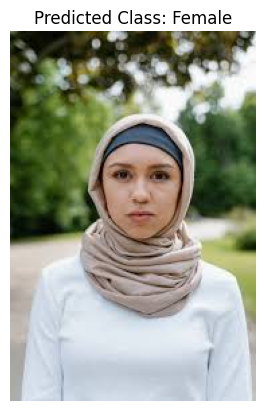

1/1 [==============================] - 0s 44ms/step


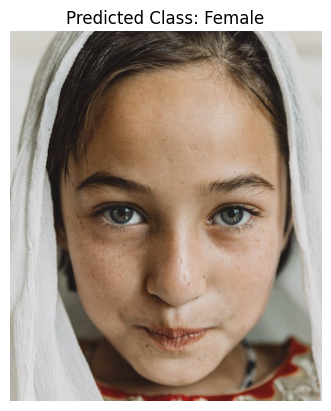

1/1 [==============================] - 0s 43ms/step


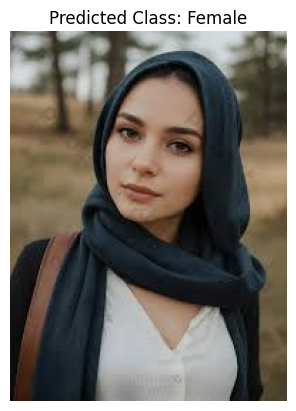

1/1 [==============================] - 0s 39ms/step


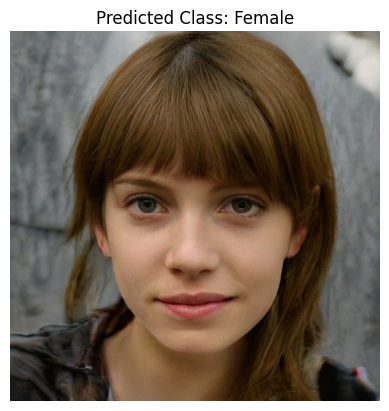

1/1 [==============================] - 0s 44ms/step


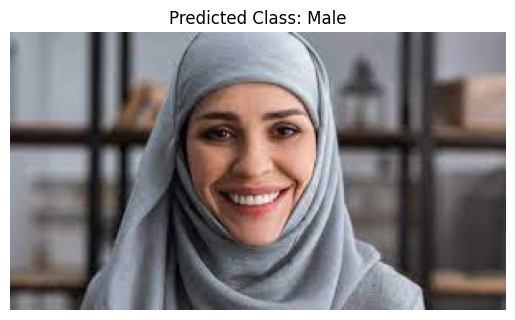

1/1 [==============================] - 0s 50ms/step


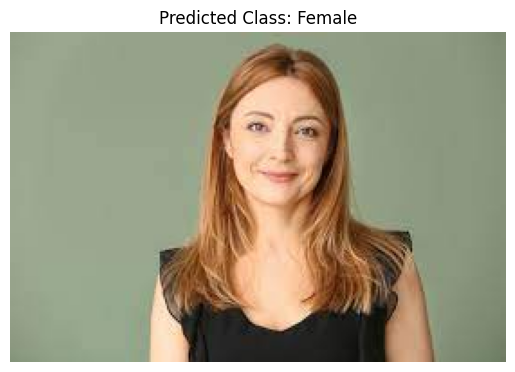

1/1 [==============================] - 0s 45ms/step


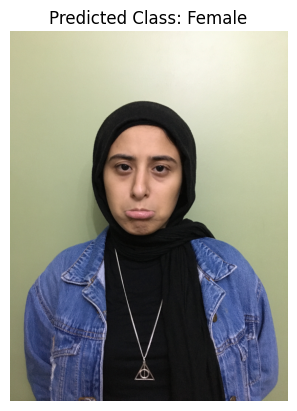

1/1 [==============================] - 0s 47ms/step


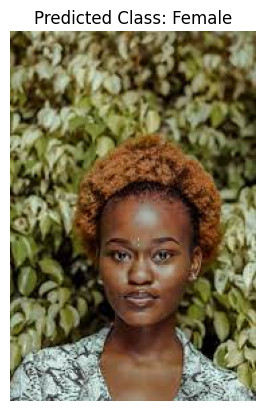

1/1 [==============================] - 0s 42ms/step


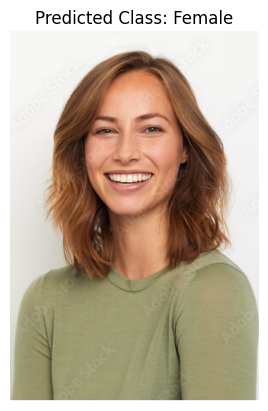

1/1 [==============================] - 0s 44ms/step


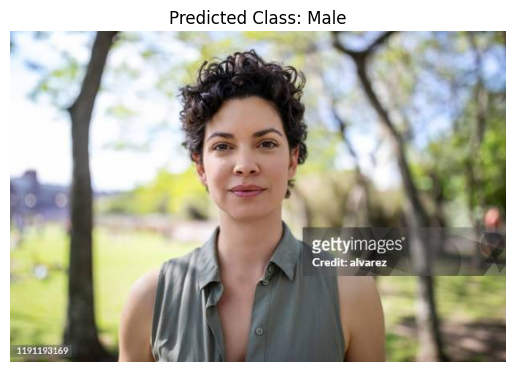

1/1 [==============================] - 0s 39ms/step


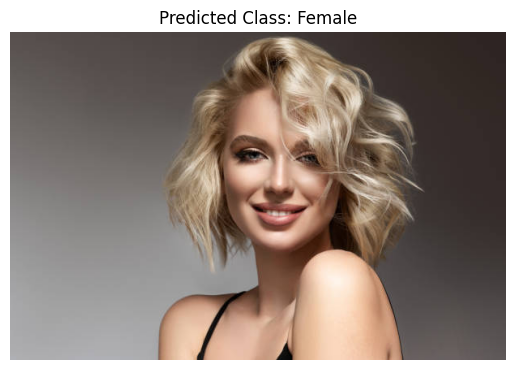

1/1 [==============================] - 0s 48ms/step


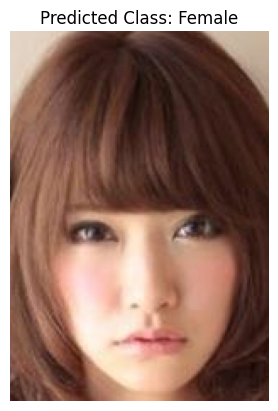

1/1 [==============================] - 0s 46ms/step


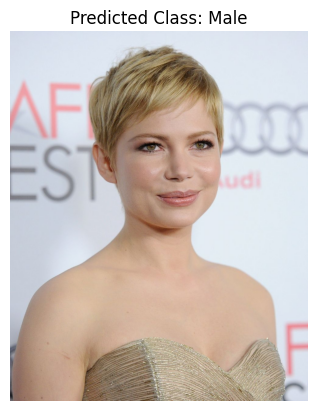

1/1 [==============================] - 0s 55ms/step


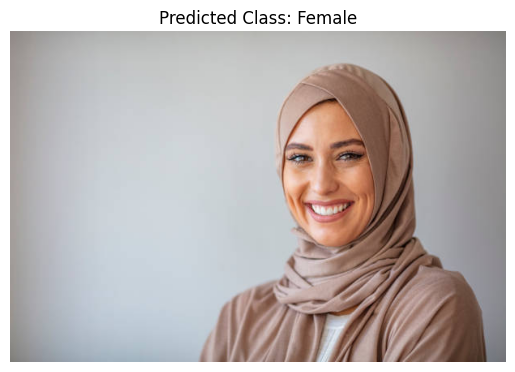

1/1 [==============================] - 0s 49ms/step


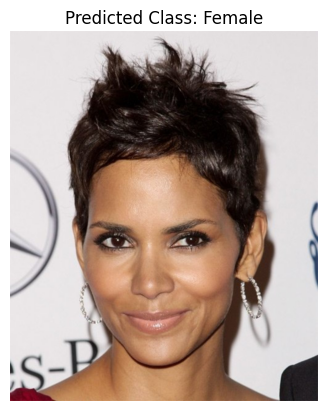

1/1 [==============================] - 0s 43ms/step


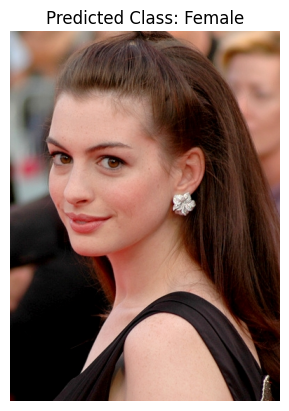

1/1 [==============================] - 0s 39ms/step


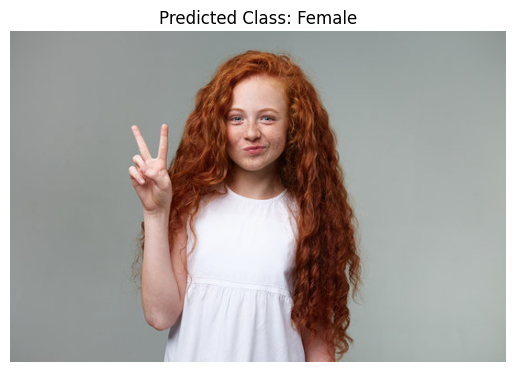

1/1 [==============================] - 0s 39ms/step


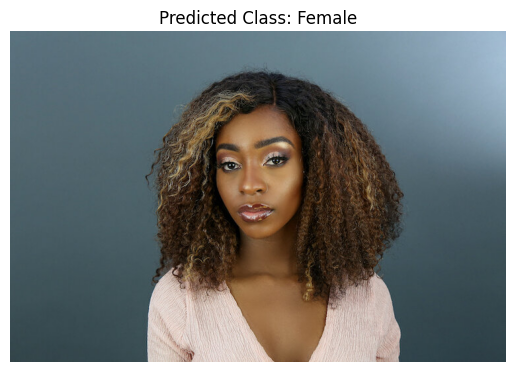

1/1 [==============================] - 0s 41ms/step


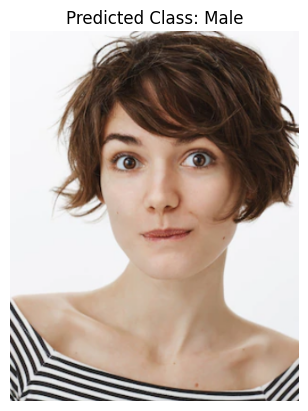

1/1 [==============================] - 0s 37ms/step


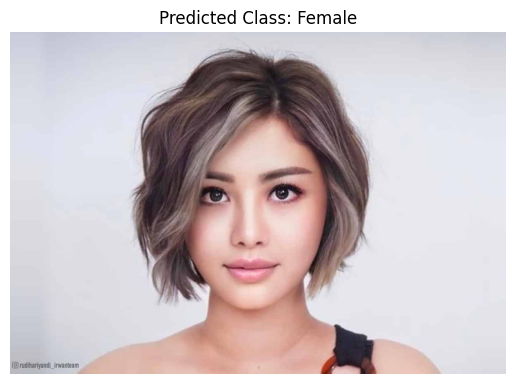

Number of times second index was less than 0.7: 8
Number of times second index was less than 0.5: 4
Number of times second index was less than 0.4: 4
{'Male': 4, 'Female': 17}


In [177]:
folder_path = './test_examples/females'
class_frequency = predict_folder(loaded_model, folder_path)
print(class_frequency)


1/1 [==============================] - 0s 89ms/step


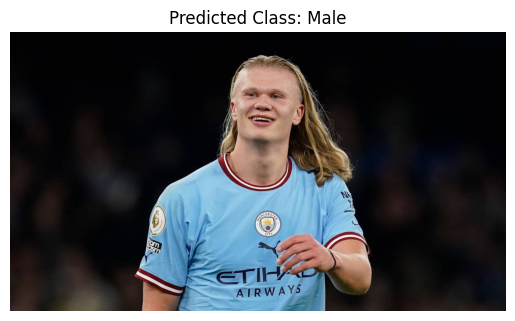

[[1.5028196e-07 9.9999988e-01]]


In [8]:
prediction = predicts(loaded_model,'./test_examples/males/male09.jpg')
print(prediction)

1/1 [==============================] - 0s 44ms/step


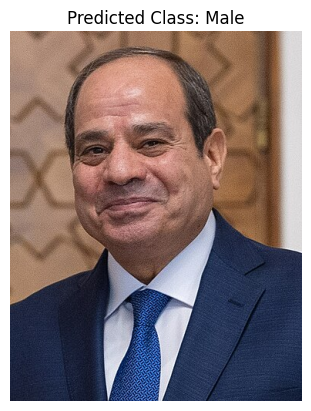

1/1 [==============================] - 0s 42ms/step


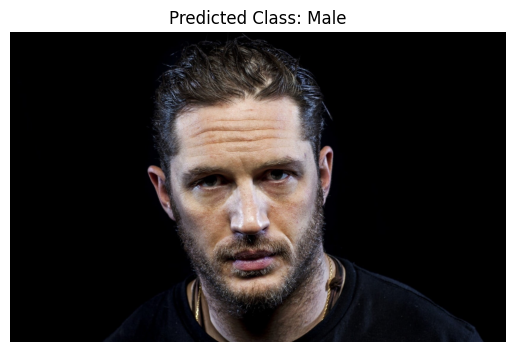

1/1 [==============================] - 0s 45ms/step


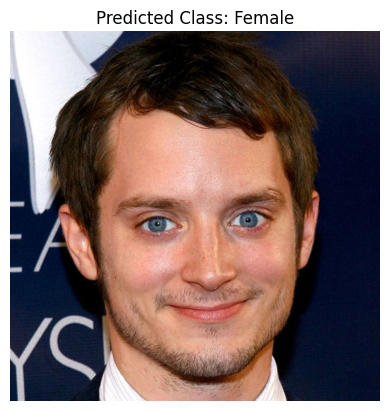

1/1 [==============================] - 0s 36ms/step


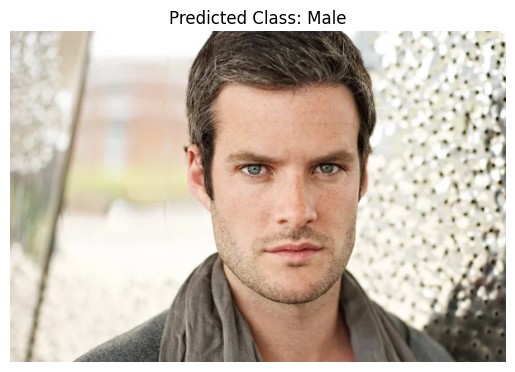

1/1 [==============================] - 0s 38ms/step


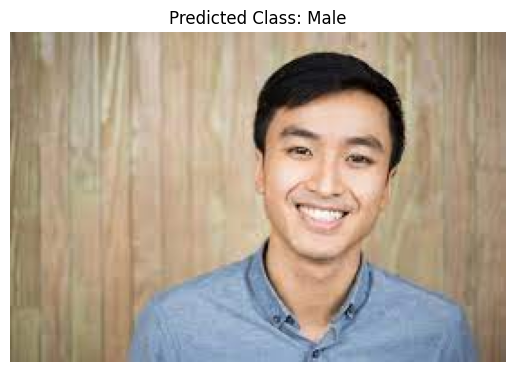

1/1 [==============================] - 0s 39ms/step


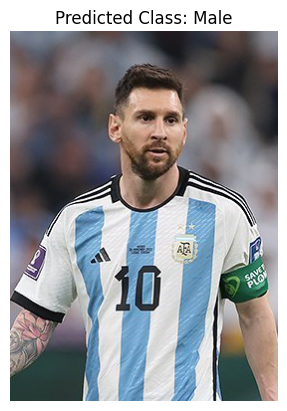

1/1 [==============================] - 0s 42ms/step


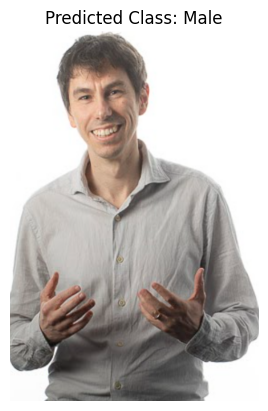

1/1 [==============================] - 0s 50ms/step


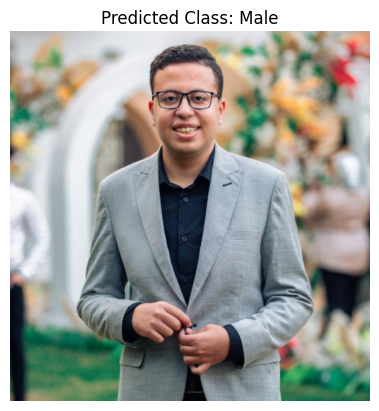

1/1 [==============================] - 0s 51ms/step


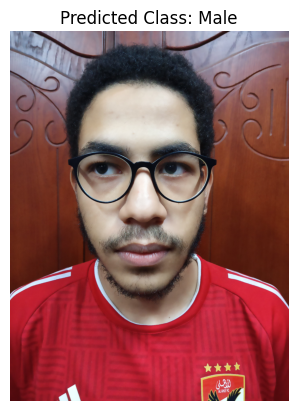

1/1 [==============================] - 0s 40ms/step


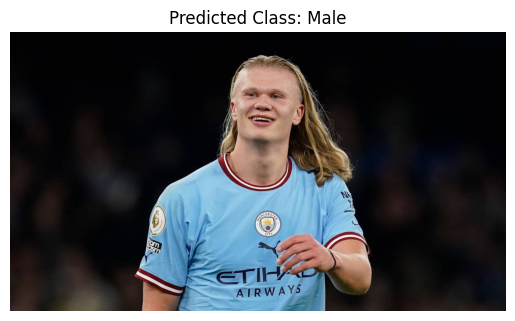

1/1 [==============================] - 0s 37ms/step


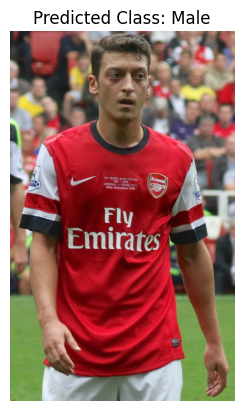

1/1 [==============================] - 0s 42ms/step


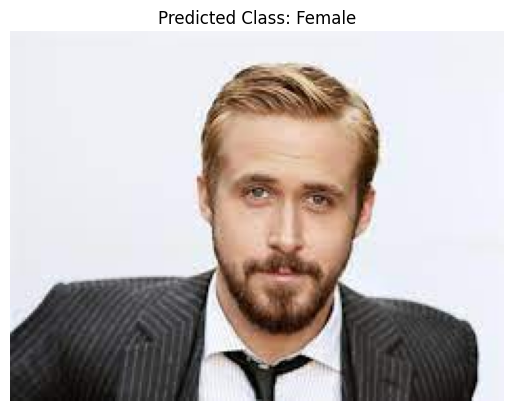

1/1 [==============================] - 0s 40ms/step


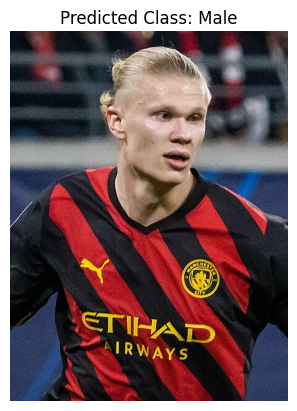

1/1 [==============================] - 0s 36ms/step


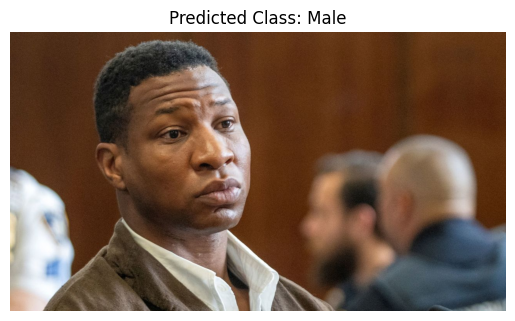

1/1 [==============================] - 0s 52ms/step


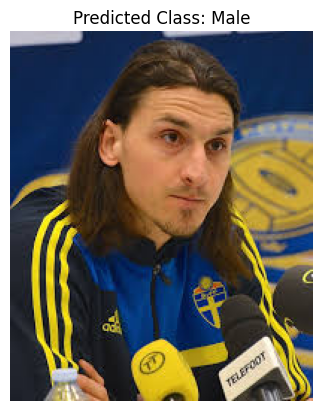

1/1 [==============================] - 0s 39ms/step


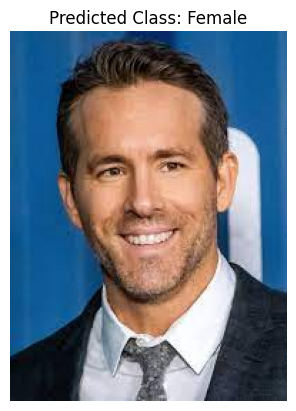

1/1 [==============================] - 0s 40ms/step


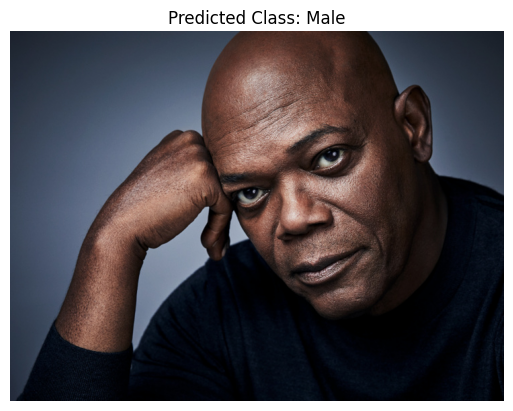

1/1 [==============================] - 0s 39ms/step


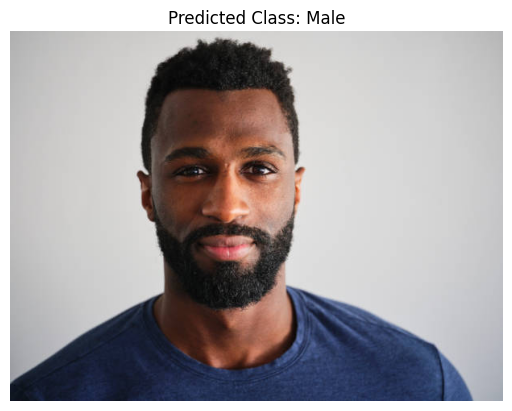

1/1 [==============================] - 0s 41ms/step


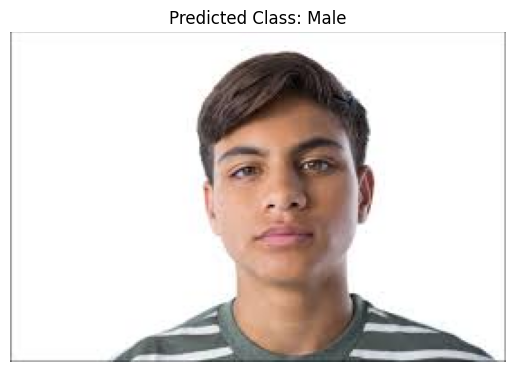

1/1 [==============================] - 0s 51ms/step


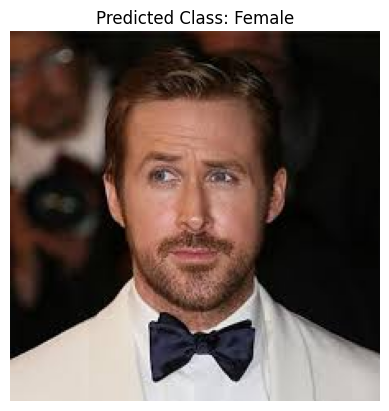

1/1 [==============================] - 0s 36ms/step


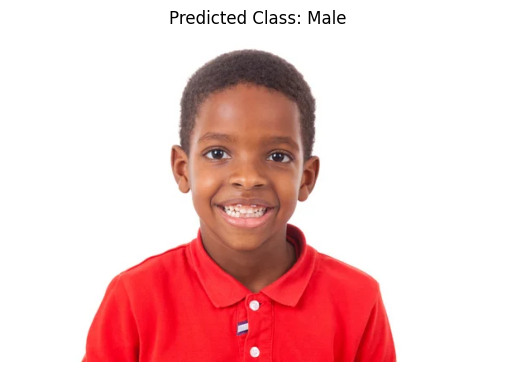

Number of times second index was less than 0.7: 17
Number of times second index was less than 0.5: 17
Number of times second index was less than 0.4: 17
{'Male': 17, 'Female': 4}


In [191]:
folder_path = './test_examples/males'
class_frequency = predict_folder(loaded_model, folder_path)
print(class_frequency)